# Bar-chart-race of covid19 data

#### Import Libraries

In [27]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
from datetime import datetime
import random
from colour import Color
import matplotlib.animation as anim

#### Change working directory

In [28]:
print("Current Working Directory " , os.getcwd())
path = "D:\R\data"
os.chdir(path)
print("\nCurrent Working Directory " , os.getcwd())

Current Working Directory  D:\R\data

Current Working Directory  D:\R\data


#### Read the data

In [29]:
df = pd.read_csv('covidData.csv', 
                 usecols=['continent', 'location', 'date', 'total_cases','total_deaths', 'total_cases_per_million','total_deaths_per_million'])
print(df.head())

#Remove null values from continent
df = df[~(df.continent.isnull())]


  continent     location        date  total_cases  total_deaths  \
0      Asia  Afghanistan  12/31/2019          0.0           0.0   
1      Asia  Afghanistan    1/1/2020          0.0           0.0   
2      Asia  Afghanistan    1/2/2020          0.0           0.0   
3      Asia  Afghanistan    1/3/2020          0.0           0.0   
4      Asia  Afghanistan    1/4/2020          0.0           0.0   

   total_cases_per_million  total_deaths_per_million  
0                      0.0                       0.0  
1                      0.0                       0.0  
2                      0.0                       0.0  
3                      0.0                       0.0  
4                      0.0                       0.0  


#### Convert the date column to dates and striptime from the values

In [30]:
df.date = pd.to_datetime(df['date'], format='%m/%d/%Y')
df['date'] = df['date'].apply(lambda x:x.date().strftime('%Y-%m-%d'))

# Removing the duplicate dates, sorting and storing in the variable
adj_dates = df.date.unique()
adj_dates = sorted(adj_dates)
#type(adj_dates)

#### Function to generate random colors 

In [31]:
random.seed(145)
def genratepseudorandomcolors():
    random_i = random.randint(0,10000000)
    random_j = random.randint(0,10000000)
    c = Color(random_i,random_j)
    hex_number = c.hex_l
    return hex_number

In [32]:
# Assigning random colors to each location
colours = []
for i in range(len(df.location.unique())) :
    colours.append(genratepseudorandomcolors())

In [33]:
# creating a zip of all the locations
colorsset = dict(zip(
    [i for i in df['location'].unique()],
    colours
))

In [34]:
#Initializing start date for plot
start_date ='2019-12-31'
current_date = start_date

#### Function to plot the horizontal bar chart for each date

In [35]:
def draw_barchart_conf(current_date):
    
    #creating dataframe for plotting 
    #In each loop it contains top 10 coutires having most number of total_cases cases
    dff = df[df['date'].eq(current_date)].groupby('location').sum().sort_values(by='total_cases', ascending=False).head(10)
    dff = dff.reset_index()
    dff = dff[::-1]
    
    #Now, let's plot a basic bar chart. We start by creating a figure and an axes.
    #Then, we use `ax.barh(x, y)` to draw horizontal barchart.
    ax.clear()
    ax.barh(dff['location'], dff['total_cases'], color=[colorsset[x] for x in dff['location']])
    
    #bar-chart alignment variable
    dx = dff['total_cases'].max() / 200
    
    #Next, let's add text,color,labels
    for i, (value, name) in enumerate(zip(dff['total_cases'], dff['location'])):
        
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    
    # Text format of Current date on the plot 
    ax.text(1, 0.4, current_date, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Total Confirmed cases', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    
    #adding other textual infomations
    ax.text(0, 1.15, f'Total Confirmed Covid-19 cases around the world from Dec 31, 2019',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    ax.text(1, 0, 'by @amreddy706 \ncredits: @aryanc55', transform=ax.transAxes, color='#777777', ha='right',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
#draw_barchart_conf(current_date=start_date)

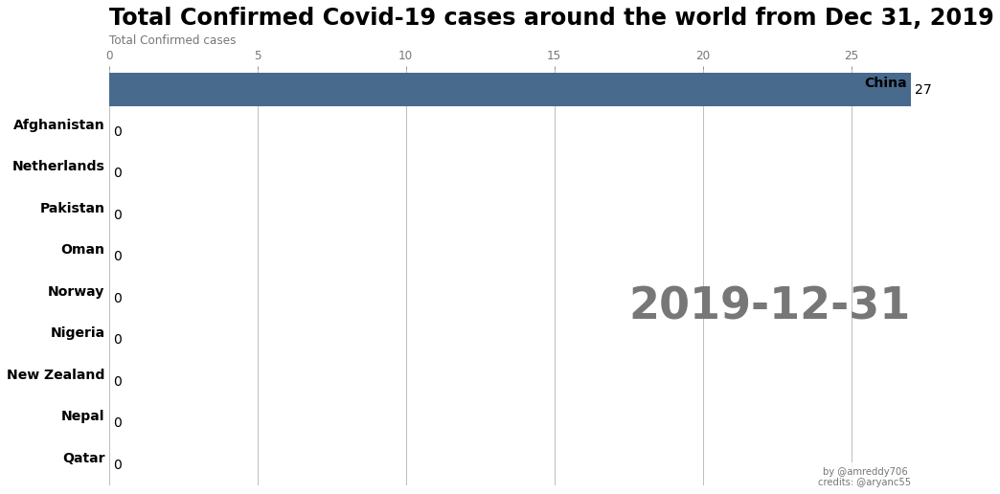

In [36]:
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart_conf, frames=adj_dates, interval = 250)
HTML(animator.to_jshtml())
# or use animator.to_html5_video() or animator.save() 

In [37]:
def draw_barchart_conf2(current_date):
    
    #creating dataframe for plotting 
    #In each loop it contains top 10 coutires having most number of total_cases cases
    dff = df[df['date'].eq(current_date)].groupby('location').sum().sort_values(by='total_deaths', ascending=False).head(10)
    dff = dff.reset_index()
    dff = dff[::-1]
    
    #Now, let's plot a basic bar chart. We start by creating a figure and an axes.
    #Then, we use `ax.barh(x, y)` to draw horizontal barchart.
    ax.clear()
    ax.barh(dff['location'], dff['total_deaths'], color=[colorsset[x] for x in dff['location']])
    
    #bar-chart alignment variable
    dx = dff['total_deaths'].max() / 200
    
    #Next, let's add text,color,labels
    for i, (value, name) in enumerate(zip(dff['total_deaths'], dff['location'])):
        
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    
    # Text format of Current date on the plot 
    ax.text(1, 0.4, current_date, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Total Confirmed deaths', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    
    #adding other textual infomations
    ax.text(0, 1.15, f'Total Confirmed Covid-19 deaths',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    ax.text(1, 0, 'by @amreddy706 \ncredits: @aryanc55', transform=ax.transAxes, color='#777777', ha='right',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
#draw_barchart_conf(current_date=start_date)

In [38]:
death_dates = adj_dates[11:]
#death_dates 

In [39]:
# fig, ax = plt.subplots(figsize=(15, 8))
# animator = animation.FuncAnimation(fig, draw_barchart_conf2, frames=death_dates, interval = 250)
# HTML(animator.to_jshtml())
# # or use animator.to_html5_video() or animator.save() 

In [40]:
def draw_barchart_conf3(current_date):
    
    #creating dataframe for plotting 
    #In each loop it contains top 10 coutires having most number of total_cases cases
    dff = df[df['date'].eq(current_date)].groupby('location').sum().sort_values(by='total_cases_per_million', ascending=False).head(10)
    dff = dff.reset_index()
    dff = dff[::-1]
    
    #Now, let's plot a basic bar chart. We start by creating a figure and an axes.
    #Then, we use `ax.barh(x, y)` to draw horizontal barchart.
    ax.clear()
    ax.barh(dff['location'], dff['total_cases_per_million'], color=[colorsset[x] for x in dff['location']])
    
    #bar-chart alignment variable
    dx = dff['total_cases_per_million'].max() / 200
    
    #Next, let's add text,color,labels
    for i, (value, name) in enumerate(zip(dff['total_cases_per_million'], dff['location'])):
        
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    
    # Text format of Current date on the plot 
    ax.text(1, 0.4, current_date, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Total Confirmed cases per million', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    
    #adding other textual infomations
    ax.text(0, 1.15, f'Total Confirmed Covid-19 cases per million',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    ax.text(1, 0, 'by @amreddy706 \ncredits: @aryanc55', transform=ax.transAxes, color='#777777', ha='right',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
#draw_barchart_conf(current_date=start_date)

In [41]:
# fig, ax = plt.subplots(figsize=(20, 8))
# animator = animation.FuncAnimation(fig, draw_barchart_conf3, frames=death_dates, interval = 250)
# HTML(animator.to_jshtml())
# # or use animator.to_html5_video() or animator.save() 

In [42]:
def draw_barchart_conf4(current_date):
    
    #creating dataframe for plotting 
    #In each loop it contains top 10 coutires having most number of total_cases cases
    dff = df[df['date'].eq(current_date)].groupby('location').sum().sort_values(by='total_deaths_per_million', ascending=False).head(10)
    dff = dff.reset_index()
    dff = dff[::-1]
    
    #Now, let's plot a basic bar chart. We start by creating a figure and an axes.
    #Then, we use `ax.barh(x, y)` to draw horizontal barchart.
    ax.clear()
    ax.barh(dff['location'], dff['total_deaths_per_million'], color=[colorsset[x] for x in dff['location']])
    
    #bar-chart alignment variable
    dx = dff['total_deaths_per_million'].max() / 200
    
    #Next, let's add text,color,labels
    for i, (value, name) in enumerate(zip(dff['total_deaths_per_million'], dff['location'])):
        
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='bottom')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    
    # Text format of Current date on the plot 
    ax.text(1, 0.4, current_date, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Total Confirmed deaths per million', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    
    #adding other textual infomations
    ax.text(0, 1.15, f'Total Confirmed Covid-19 deaths per million',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    ax.text(1, 0, 'by @amreddy706 \ncredits: @aryanc55', transform=ax.transAxes, color='#777777', ha='right',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
#draw_barchart_conf(current_date=start_date)

In [43]:
death_dates = adj_dates[31:]

In [44]:
# fig, ax = plt.subplots(figsize=(20, 8))
# animator = animation.FuncAnimation(fig, draw_barchart_conf4, frames=death_dates, interval = 250)
# HTML(animator.to_jshtml())
# # or use animator.to_html5_video() or animator.save() 

In [45]:
# Set up formatting for the movie files
# Writer = animation.writers['ffmpeg']
# writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

# animator.save('barChartRaceAmr.mp4', writer= writer)
# ffmpeg movie writer needs to be downloaded externally and integrated with Python 

# Reference
1. https://www.kaggle.com/aryanc55/covid-19-bar-chart-race
2. http://blog.gregzaal.com/how-to-install-ffmpeg-on-windows/ (How to install ffmpeg in windows)

# Data Source
https://github.com/owid/covid-19-data/tree/master/public/data